In [1]:
!pip install torchbnn

import os
import numpy as np
import pandas as pd
import torch 
import warnings 
warnings.filterwarnings("ignore") 
import time 
import random
from sklearn.linear_model import LinearRegression 
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
import sklearn.gaussian_process as gp 
from sklearn.gaussian_process.kernels import DotProduct as lin, WhiteKernel, RBF, ConstantKernel, RBF, WhiteKernel, RationalQuadratic, Exponentiation
import matplotlib.pyplot as plt

from torch._C import device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import MultiStepLR
import torch.nn.functional as F
from torch import nn

from torch.utils.data import Dataset, DataLoader, random_split, TensorDataset
import torchvision.transforms as transforms

import tqdm

In [2]:
import torchbnn as bnn

model = nn.Sequential(
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=15, out_features=50),
    nn.Tanh(),
    nn.BatchNorm1d(50),
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=50, out_features=2)
) 

model = model.to(device) 

In [3]:
from google.colab import drive 
drive.mount('/content/drive')

Mounted at /content/drive


## BNN FOR DUAL OUTPUT ON LINEAR_ERROR_1.CSV


In [6]:
num_epochs = 500
kl_loss = bnn.BKLLoss(reduction='mean', last_layer_only=False)
Batch_size = 256 
kl_weight = 0.1
optimizer = Adam(model.parameters(), lr=0.01)
mse_loss = nn.MSELoss() 

df_1 = pd.read_csv('drive/MyDrive/Auto/Data/Linear_error/linear_error_1.csv')
drop = ['no_sim', 'time_step_H'] 
k = len(df_1)//100 * 80 
for j in df_1.columns:
  if len(j) >= 7 and j[:7] == 'Unnamed':
    df_1.drop(j, axis = 1, inplace =True)

for i in drop:
  df_1.drop(i, axis = 1, inplace = True)

ss = StandardScaler()


X = torch.from_numpy(ss.fit_transform(df_1.iloc[:k, :-2])).float().to(device)  #train X
Y = torch.from_numpy( df_1.iloc[:k, -2:].to_numpy() ).float().to(device) #test Y
dataset = TensorDataset(X, Y)

Test_X = torch.from_numpy(ss.fit_transform(df_1.iloc[k:, :-2])).float().to(device)
Test_Y = torch.from_numpy( df_1.iloc[k:, -2:].to_numpy() ).float().to(device)
Test_dataset = TensorDataset(Test_X, Test_Y)

data_loader = DataLoader(dataset, batch_size=Batch_size, shuffle = False) 
test_data_loader = DataLoader(Test_dataset, batch_size=Batch_size, shuffle= False)

epochs_iter = tqdm.notebook.tqdm(range(num_epochs), desc="Epoch") 

LOSS, KL = [], []

for i in epochs_iter:
  minibatch_iter = tqdm.notebook.tqdm(data_loader, desc="Minibatch", leave=False)
  for x_batch, y_batch in minibatch_iter:
    output = model(x_batch)
    mse = mse_loss(output, y_batch)

    LOSS.append(mse.item())
    
    kl = kl_loss(model)
    cost = mse + kl_weight*kl

    KL.append(cost.item())

    optimizer.zero_grad()
    cost.backward()
    optimizer.step()

    minibatch_iter.set_postfix(mse=mse.item(), KL= kl.item())
    

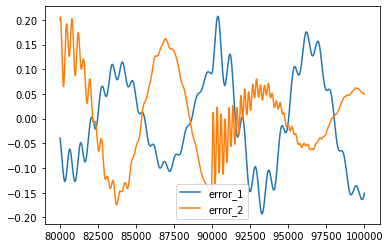

In [7]:
plt.plot(df_1.iloc[k:, -2:-1], label='error_1')
plt.plot(df_1.iloc[k:, -1:], label='error_2')
plt.legend()


In [8]:
model.eval()
i = 0
pred_error_1 = []
pred_error_2 = []
for x,y in test_data_loader:
  y_pred = model(x)
  pred_error_1.append( y_pred[:, 0].detach().cpu().numpy() )
  pred_error_2.append( y_pred[:, 1].detach().cpu().numpy() )

Pred_error_1 = list(np.concatenate(pred_error_1).flat) 
Pred_error_2 = list(np.concatenate(pred_error_2).flat) 

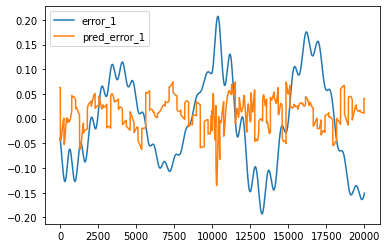

In [9]:
kk = df_1.iloc[k:, -2:-1].to_numpy()
plt.plot(kk, label='error_1') 
plt.plot(Pred_error_1, label='pred_error_1')
plt.legend()

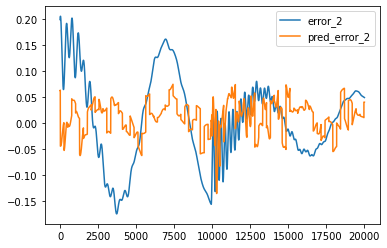

In [10]:
kk = df_1.iloc[k:, -1:].to_numpy()
plt.plot(kk, label='error_2') 
plt.plot(Pred_error_1, label='pred_error_2')
plt.legend() 

In [ ]:
path, dirs, files = next(os.walk("drive/MyDrive/Auto/Data/Linear_error"))
file_count = len(files) 

Batch_size = 128
num_epochs = 100 #for each dataset 
optimizer = Adam(model.parameters(), lr=0.01)
mse_loss = nn.MSELoss() 
kl_loss = bnn.BKLLoss(reduction='mean', last_layer_only=False)
kl_weight = 0.1 

Loss = {}
KL = {}

def pd_to_torch(k):
  return torch.from_numpy(k.values).float().to(device) 

file_count_iter = tqdm.notebook.tqdm(range(file_count), desc="simulations") 

for i in file_count_iter:
  csv_file = f"drive/MyDrive/Auto/Data/Linear_error/linear_error_{i+1}.csv"  

  df = pd.read_csv(csv_file) 
  Drop = ['no_sim', 'time_step_H']
  
  for j in df.columns: #remove unnamed 
    if len(j) >=7 and j[:7] == 'Unnamed':
      df.drop(j, axis = 1, inplace = True) 

  for j in Drop:
    df.drop(j, axis = 1, inplace = True) #dropping no_sim and time_stamp_h
  
  ss = StandardScaler()

  X = torch.from_numpy(ss.fit_transform(df.iloc[:, :-2])).float().to(device) 
  Y = torch.from_numpy( df.iloc[:, -2:].to_numpy() ).float().to(device) 
  dataset = TensorDataset(X, Y)

  data_loader = DataLoader(dataset, batch_size=Batch_size, shuffle = False) 

  epochs_iter = tqdm.notebook.tqdm(range(num_epochs), desc="Epoch") 

  Loss[i], KL[i] = [], []

  for k in epochs_iter:
    minibatch_iter = tqdm.notebook.tqdm(data_loader, desc="Minibatch", leave=False) 

    for x_batch, y_batch in minibatch_iter:
      output = model(x_batch)
      mse = mse_loss(output, y_batch)

      Loss[i].append(mse.item())
      
      kl = kl_loss(model)
      cost = mse + kl_weight*kl

      KL[i].append(cost.item())

      optimizer.zero_grad()
      cost.backward()
      optimizer.step()

      minibatch_iter.set_postfix(mse=mse.item(), KL= kl.item())
      

In [ ]:
torch.save(model.state_dict(), 'drive/MyDrive/Auto/BNN/BNN.pth')


##TEST

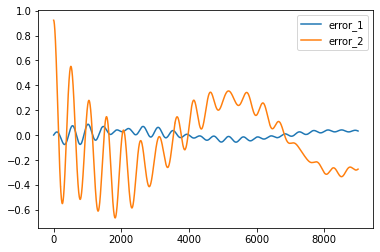

In [ ]:
test_csv_file_name = f"drive/MyDrive/Auto/Data/Linear_Test/Test_data_1.csv"
test_csv = pd.read_csv(test_csv_file_name)
test_df = test_csv.iloc[:, 1:]

plt.plot(test_df['error_1'], label='error_1')
plt.plot(test_df['error_2'], label='error_2')
plt.legend()
plt.savefig('')

In [ ]:
ss = StandardScaler()
test_batch_size = 128
test_X = torch.from_numpy(ss.fit_transform(test_df.iloc[:, :-2])).float().to(device) 
test_Y = torch.from_numpy( test_df.iloc[:, -2:].to_numpy() ).float().to(device) 
test_dataset = TensorDataset(test_X, test_Y)

test_data_loader = DataLoader(test_dataset, batch_size=test_batch_size, shuffle = False) 

In [ ]:
model.eval()
i = 0
pred_error_1 = []
pred_error_2 = []
for x,y in test_data_loader:
  y_pred = model(x)
  pred_error_1.append( y_pred[:, 0].detach().cpu().numpy() )
  pred_error_2.append( y_pred[:, 1].detach().cpu().numpy() )

Pred_error_1 = list(np.concatenate(pred_error_1).flat) 
Pred_error_2 = list(np.concatenate(pred_error_2).flat) 

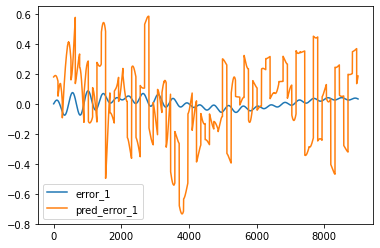

In [ ]:
plt.plot(test_df['error_1'], label='error_1')
plt.plot(Pred_error_1, label='pred_error_1')

plt.legend()
plt.savefig('drive/MyDrive/Auto/BNN/error_1_together.png')

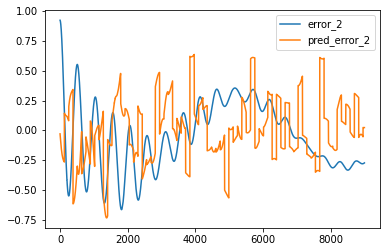

In [ ]:
plt.plot(test_df['error_2'], label='error_2')
plt.plot(Pred_error_2, label='pred_error_2')

plt.legend()
plt.savefig('drive/MyDrive/Auto/BNN/error_2_together.png')

## so different models for error_1 and error_2

In [ ]:
model_1 = nn.Sequential(
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=15, out_features=50),
    nn.Tanh(),
    nn.BatchNorm1d(50),
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=50, out_features=2)
)

model_2 = nn.Sequential(
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=15, out_features=50),
    nn.Tanh(),
    nn.BatchNorm1d(50),
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=50, out_features=2)
)

model_1 = model_1.to(device)
model_2 = model_2.to(device)


In [ ]:
path, dirs, files = next(os.walk("drive/MyDrive/Auto/Data/Linear_error"))
file_count = len(files) 

Batch_size = 128
num_epochs = 100 #for each dataset 
optimizer_1 = Adam(model.parameters(), lr=0.01)
mse_loss_1 = nn.MSELoss() 
kl_loss_1 = bnn.BKLLoss(reduction='mean', last_layer_only=False)
kl_weight = 0.1 

Loss_1 = {}
KL_1 = {}
file_count_iter = tqdm.notebook.tqdm(range(file_count), desc="simulations") 
for i in file_count_iter:
  csv_file = f"drive/MyDrive/Auto/Data/Linear_error/linear_error_{i+1}.csv"  

  df = pd.read_csv(csv_file) 
  Drop = ['no_sim', 'time_step_H']
  
  for j in df.columns: #remove unnamed 
    if len(j) >=7 and j[:7] == 'Unnamed':
      df.drop(j, axis = 1, inplace = True) 

  for j in Drop:
    df.drop(j, axis = 1, inplace = True) #dropping no_sim and time_stamp_h
  
  ss = StandardScaler()

  X = torch.from_numpy(ss.fit_transform(df.iloc[:, :-2])).float().to(device) 
  Y_1 = torch.from_numpy( df.iloc[:, -2:-1].to_numpy() ).float().to(device) #y_1 = error_1
  dataset = TensorDataset(X, Y_1)

  data_loader = DataLoader(dataset, batch_size=Batch_size, shuffle = False) 

  epochs_iter = tqdm.notebook.tqdm(range(num_epochs), desc="Epoch") 

  Loss_1[i], KL_1[i] = [], []

  for k in epochs_iter:
    minibatch_iter = tqdm.notebook.tqdm(data_loader, desc="Minibatch", leave=False) 

    for x_batch, y_batch in minibatch_iter:
      output = model_1(x_batch)
      mse = mse_loss_1(output, y_batch)

      Loss_1[i].append(mse.item())
      
      kl = kl_loss_1(model)
      cost = mse + kl_weight*kl

      KL_1[i].append(cost.item())

      optimizer_1.zero_grad()
      cost.backward()
      optimizer_1.step()

      minibatch_iter.set_postfix(mse=mse.item(), KL= kl.item()) 



In [ ]:
torch.save(model_1.state_dict(), 'drive/MyDrive/Auto/BNN/BNN_1.pth') 

In [ ]:
model_1.eval()
i = 0
pred_error_1 = [] 
for x,y in test_data_loader:
  y_pred = model_1(x)
  pred_error_1.append( y_pred[:, 0].detach().cpu().numpy() )
  #pred_error_2.append( y_pred[:, 1].detach().cpu().numpy() )

Pred_error_1 = list(np.concatenate(pred_error_1).flat) 
#Pred_error_2 = list(np.concatenate(pred_error_2).flat) 


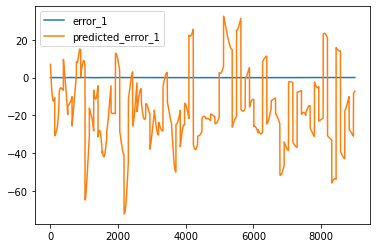

In [ ]:
plt.plot(test_df['error_1'], label='error_1') 
plt.plot(Pred_error_1, label ='predicted_error_1')
plt.legend()

In [ ]:
path, dirs, files = next(os.walk("drive/MyDrive/Auto/Data/Linear_error"))
file_count = len(files) 

Batch_size = 128
num_epochs = 100 #for each dataset 
optimizer_2 = Adam(model.parameters(), lr=0.01)
mse_loss_2 = nn.MSELoss() 
kl_loss_2 = bnn.BKLLoss(reduction='mean', last_layer_only=False)
kl_weight = 0.1 

Loss_2 = {}
KL_2 = {}

file_count_iter = tqdm.notebook.tqdm(range(file_count), desc="simulations") 

for i in file_count_iter:
  csv_file = f"drive/MyDrive/Auto/Data/Linear_error/linear_error_{i+1}.csv"  

  df = pd.read_csv(csv_file) 
  Drop = ['no_sim', 'time_step_H']
  
  for j in df.columns: #remove unnamed 
    if len(j) >=7 and j[:7] == 'Unnamed':
      df.drop(j, axis = 1, inplace = True) 

  for j in Drop:
    df.drop(j, axis = 1, inplace = True) #dropping no_sim and time_stamp_h
  
  ss = StandardScaler()

  X = torch.from_numpy(ss.fit_transform(df.iloc[:, :-2])).float().to(device) 
  Y_2 = torch.from_numpy( df.iloc[:, -1:].to_numpy() ).float().to(device) #y_2 = error_2
  dataset = TensorDataset(X, Y_2)

  data_loader = DataLoader(dataset, batch_size=Batch_size, shuffle = False) 

  epochs_iter = tqdm.notebook.tqdm(range(num_epochs), desc="Epoch") 

  Loss_2[i], KL_2[i] = [], []

  for k in epochs_iter:
    minibatch_iter = tqdm.notebook.tqdm(data_loader, desc="Minibatch", leave=False) 

    for x_batch, y_batch in minibatch_iter:
      output = model_2(x_batch)
      mse = mse_loss_2(output, y_batch)

      Loss_2[i].append(mse.item())
      
      kl = kl_loss_2(model)
      cost = mse + kl_weight*kl

      KL[i].append(cost.item())

      optimizer_2.zero_grad()
      cost.backward()
      optimizer_2.step()

      minibatch_iter.set_postfix(mse=mse.item(), KL= kl.item())

KeyboardInterrupt: ignored

In [ ]:
torch.save(model_1.state_dict(), 'drive/MyDrive/Auto/BNN/BNN_2.pth')